# Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

import cv2

plt.style.use('dark_background')

from pynistview_utils import *
from selelems import *

# Set up directories and files

In [2]:
# Configure input files

indir = "/Users/rmoraski/Documents/iCloud/School/Electrons/NISTView-ish/"

im_suffix, m1_suffix, m2_suffix = "_ix.sempa", "_mx.sempa", "_my.sempa"
#im_suffix, m1_suffix, m2_suffix = "_ix2.sempa", "_mx2.sempa", "_mz.sempa"

name = "191001_Fe_whisker/Fe_whisker"
#name = "FeGd_Nov_Dec/171117_FeGd"
#name = "FeGd_Nov_Dec/FeGd100"
#name = "FeGd_Nov_Dec/FeGd200"

run = 2

full_name = name + f'{run:0>3}'

file = indir + full_name

# Specify the number of features - 1 in the image. This is used to segment and create masks.

segments = 1

# Specify gaussian denoising sigma

sigma = 1

# Specify non-local denoising strength h. Larger h -> more denoising.

h = 20

# Import files

In [3]:
# Read in image data.

intensity, _ = image_data(file + im_suffix)
m_1, axis_1 = image_data(file + m1_suffix)
m_2, axis_2 = image_data(file + m2_suffix)

# Get file dimensions

m_1_ydim, m_1_xdim = m_1.shape
m_2_ydim, m_2_xdim = m_2.shape

# Extract extrema for later processing

m_1_min, m_1_max = m_1.min(), m_1.max()
m_2_min, m_2_max = m_2.min(), m_2.max()

# Flatten the intensity image

intensity_blurred = median_filter(intensity, 3);
intensity_flat = intensity - intensity_blurred;

scale = get_scale(file + im_suffix)

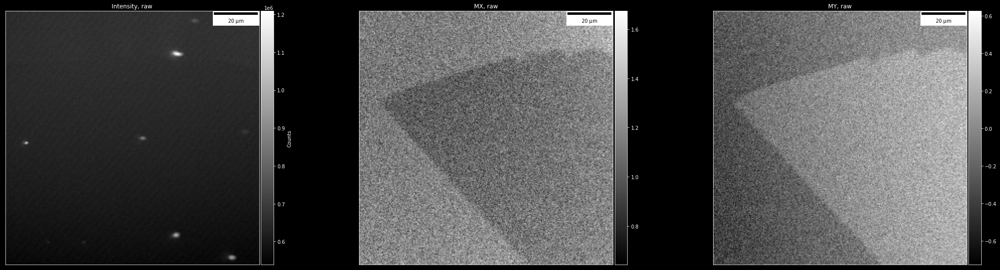

In [4]:
# Have a look at the input files

fig = plt.figure(figsize=(30, 15));

ax1 = show_subplot_raw(intensity, 2, 3, 1, 'Intensity, raw');
ax1.add_artist(ScaleBar(scale));

# Add a colorbar for counts
sm1 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(intensity.min(), intensity.max()))
divider1 = make_axes_locatable(ax1);
cax1 = divider1.append_axes('right', size='5%', pad=0.05);
sm1.set_array([]);
cbar1 = plt.colorbar(sm1, cax=cax1, orientation='vertical');
cbar1.set_label('Counts')

ax2 = show_subplot_raw(m_1, 2, 3, 2, 'M{}, raw'.format(axis_1));
ax2.add_artist(ScaleBar(scale));

sm2 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_1.min(), m_1.max()))
divider2 = make_axes_locatable(ax2);
cax2 = divider2.append_axes('right', size='5%', pad=0.05);
sm2.set_array([]);
cbar2 = plt.colorbar(sm2, cax=cax2, orientation='vertical');
#cbar2.set_label('Counts')

ax3 = show_subplot_raw(m_2, 2, 3, 3, 'M{}, raw'.format(axis_2));
ax3.add_artist(ScaleBar(scale));

sm3 = cm.ScalarMappable(cmap='gray', norm=plt.Normalize(m_2.min(), m_2.max()))
divider3 = make_axes_locatable(ax3);
cax3 = divider3.append_axes('right', size='5%', pad=0.05);
sm3.set_array([]);
cbar3 = plt.colorbar(sm3, cax=cax3, orientation='vertical');
#cbar3.set_label('Counts')

plt.tight_layout();

# Remove gradients

Imperfections in the imaging components might leave undesirable gradient artifacts in the image.

## Remove line errors

In [5]:
m_1_delined, m_2_delined = remove_line_errors(m_1, 20), remove_line_errors(m_2, 20)
m_1_delined, m_2_delined = rescale(m_1_delined, m_1_min, m_1_max), rescale(m_2_delined, m_2_min, m_2_max)

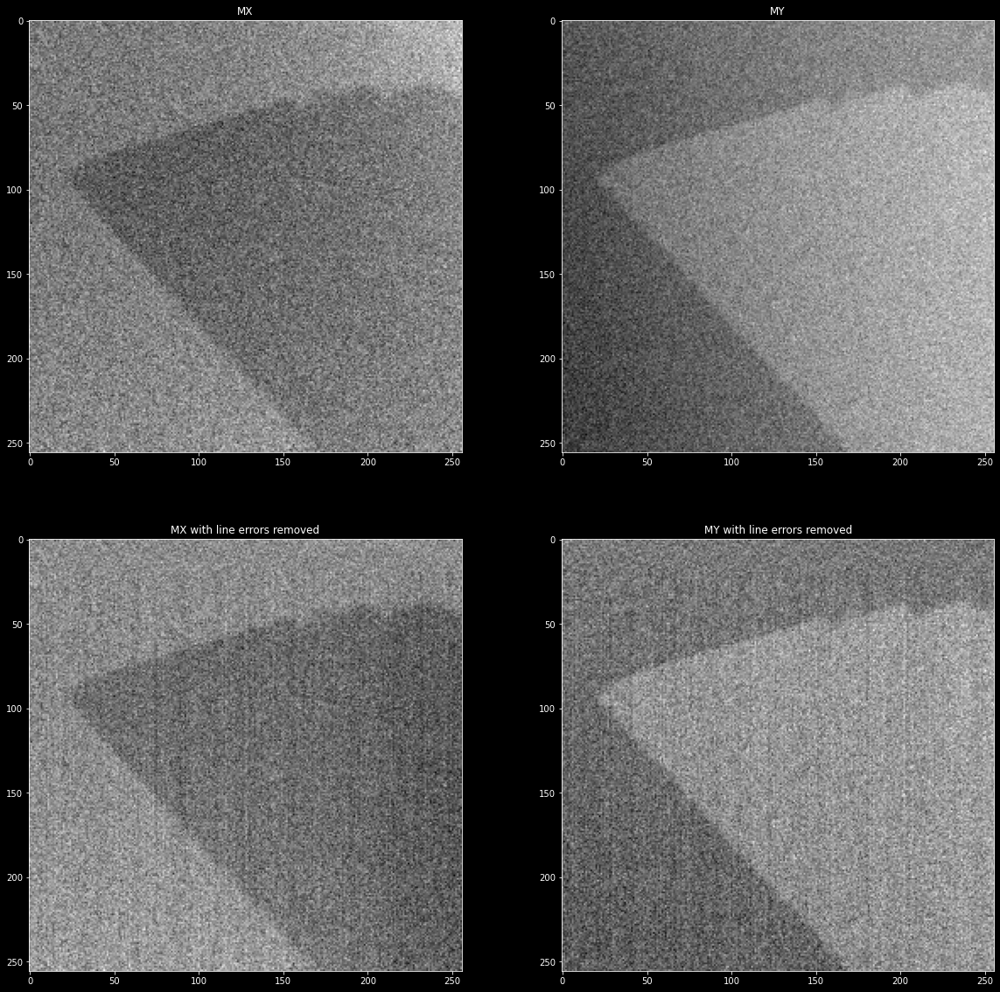

In [6]:
plt.figure(figsize=(20, 20));
plt.subplot(2, 2, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{}'.format(axis_1));
plt.subplot(2, 2, 2);
plt.imshow(m_2, cmap='gray');
plt.title('M{}'.format(axis_2));
plt.subplot(2, 2, 3);
plt.imshow(m_1_delined, cmap='gray');
plt.title('M{} with line errors removed'.format(axis_1));
plt.subplot(2, 2, 4);
plt.imshow(m_2_delined, cmap='gray');
plt.title('M{} with line errors removed'.format(axis_2));

## Mean shift

This is used to improve image segmentation

In [7]:
m_1_shift, m_2_shift = mean_shift_filter(m_1_delined), mean_shift_filter(m_2_delined)

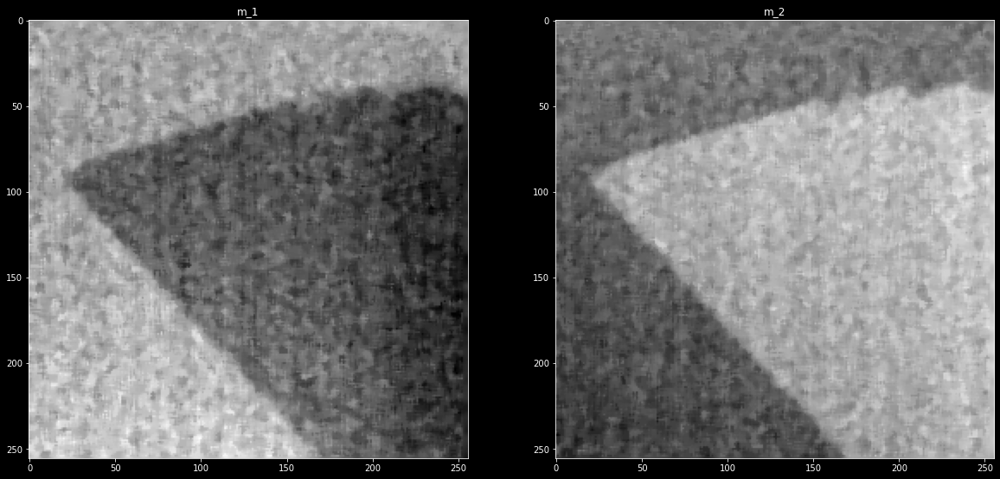

In [8]:
plt.figure(figsize=(20, 10));
plt.subplot(1, 2, 1);
plt.imshow(m_1_shift, cmap='gray');
plt.title('m_1');

plt.subplot(1, 2, 2);
plt.imshow(m_2_shift, cmap='gray');
plt.title('m_2');

## Segment

Find the features in the images

In [9]:
m_1_thresh, m_1_seg, m_1_masks = segment_image(m_1_shift, segments=segments)
m_2_thresh, m_2_seg, m_2_masks = segment_image(m_2_shift, segments=segments)

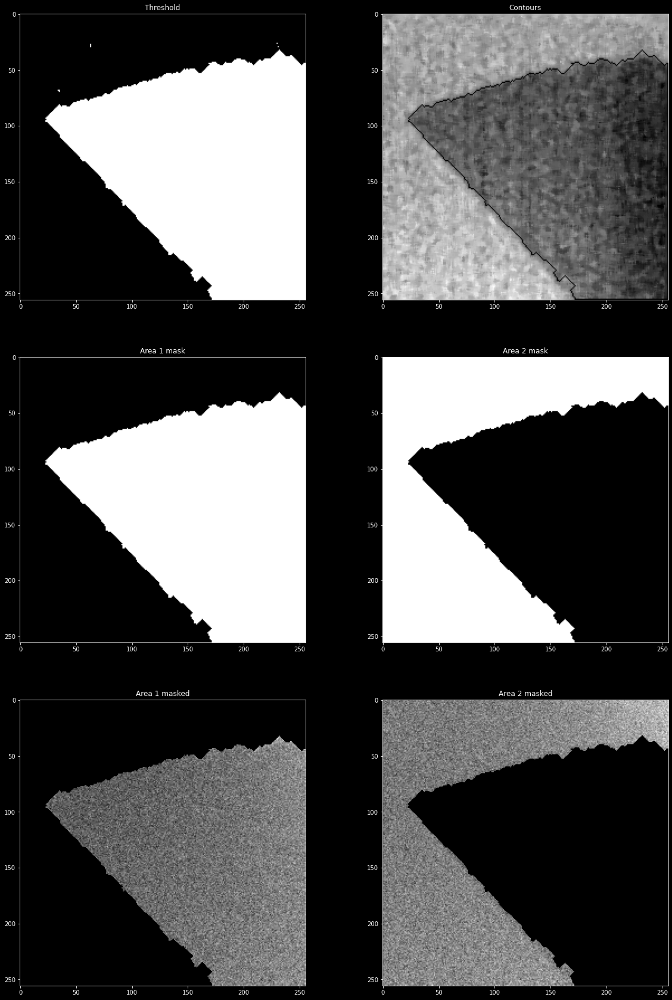

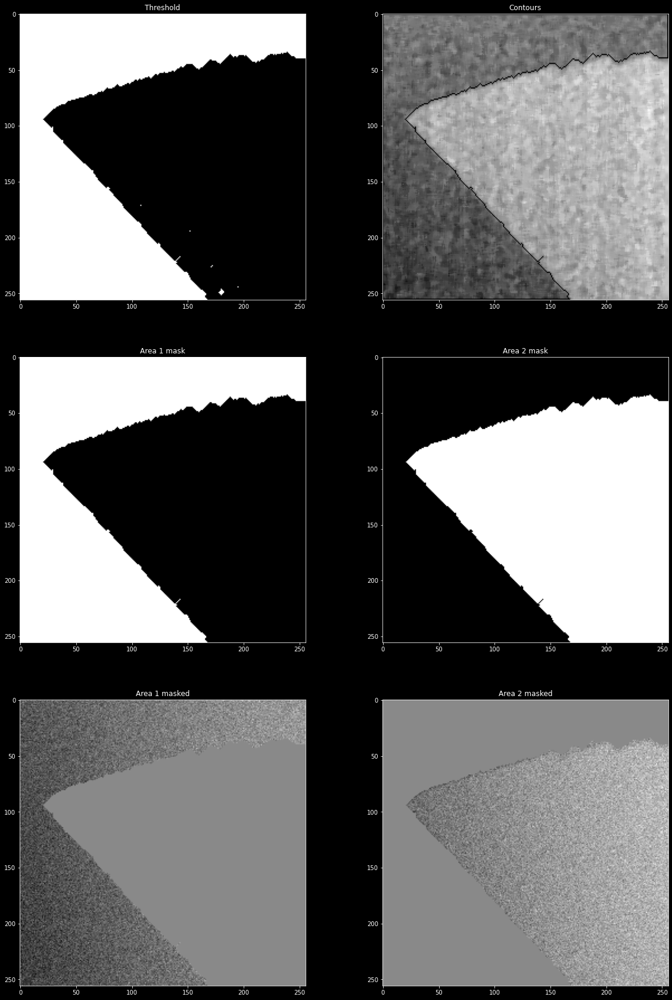

In [10]:
plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_1_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_1_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_1_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_1_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_1 * m_1_masks[0, 0], vmin=m_1_min, vmax=m_1_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_1 * m_1_masks[0, 1], vmin=m_1_min, vmax=m_1_max, cmap='gray');
plt.title('Area 2 masked');

plt.figure(figsize=(20, 30));
plt.subplot(3, 2, 1);
plt.imshow(m_2_thresh, cmap='gray');
plt.title('Threshold');
plt.subplot(3, 2, 2);
plt.imshow(m_2_seg, cmap='gray');
plt.title('Contours');
plt.subplot(3, 2, 3);
plt.imshow(m_2_masks[0, 0], cmap='gray');
plt.title('Area 1 mask');
plt.subplot(3, 2, 4);
plt.imshow(m_2_masks[0, 1], cmap='gray');
plt.title('Area 2 mask');
plt.subplot(3, 2, 5);
plt.imshow(m_2 * m_2_masks[0, 0], vmin=m_2_min, vmax=m_2_max, cmap='gray');
plt.title('Area 1 masked');
plt.subplot(3, 2, 6);
plt.imshow(m_2 * m_2_masks[0, 1], vmin=m_2_min, vmax=m_2_max, cmap='gray');
plt.title('Area 2 masked');

## Fit images

Find a polynomial fit for the images and remove the background gradient

In [11]:
# m_1 first
m_1_light_mask, m_1_dark_mask = m_1_masks[0, 0], m_1_masks[0, 1]

m_1_light_fit_all, m_1_light_fit = fit_image(m_1, m_1_light_mask)
m_1_dark_fit_all, m_1_dark_fit = fit_image(m_1, m_1_dark_mask)

m_1_light_fitted, m_1_dark_fitted = m_1 - m_1_light_fit_all, m_1 - m_1_dark_fit_all

# and m_2
m_2_light_mask, m_2_dark_mask = m_2_masks[0, 0], m_2_masks[0, 1]

m_2_light_fit_all, m_2_light_fit = fit_image(m_2, m_2_light_mask)
m_2_dark_fit_all, m_2_dark_fit = fit_image(m_2, m_2_dark_mask)

m_2_light_fitted, m_2_dark_fitted = m_2 - m_2_light_fit_all, m_2 - m_2_dark_fit_all


# Rescale both
m_1_light_fitted, m_2_light_fitted = rescale_to(m_1_light_fitted, m_1), rescale_to(m_2_light_fitted, m_2)

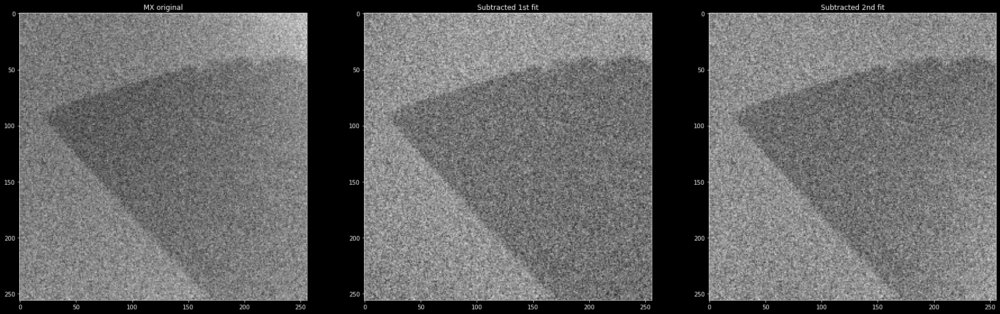

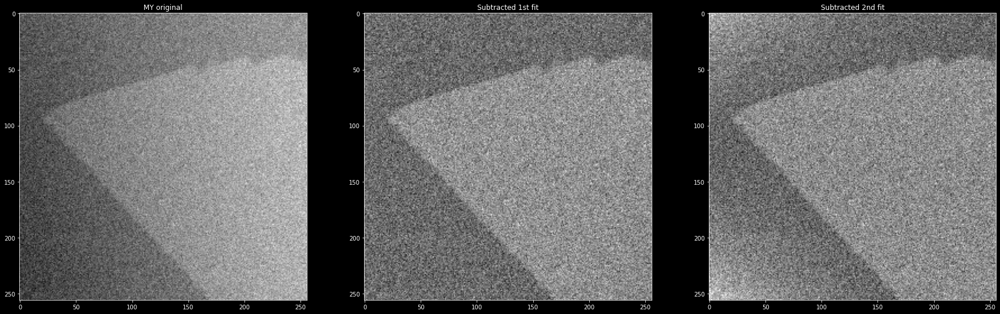

In [12]:
plt.figure(figsize=(30, 30));

plt.subplot(1, 3, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{} original'.format(axis_1));
plt.subplot(1, 3, 2);
plt.imshow(m_1_light_fitted, cmap='gray');
plt.title('Subtracted 1st fit');
plt.subplot(1, 3, 3);
plt.imshow(m_1 - m_1_dark_fit_all, cmap='gray');
plt.title('Subtracted 2nd fit');

plt.figure(figsize=(30, 30));
plt.subplot(1, 3, 1);
plt.imshow(m_2, cmap='gray');
plt.title('M{} original'.format(axis_2));
plt.subplot(1, 3, 2);
plt.imshow(m_2_light_fitted, cmap='gray');
plt.title('Subtracted 1st fit');
plt.subplot(1, 3, 3);
plt.imshow(m_2 - m_2_dark_fit_all, cmap='gray');
plt.title('Subtracted 2nd fit');

# Remove noise

In [13]:
m_1_fitted_denoised, m_1_fitted_denoised_blurred = clean_image(m_1_light_fitted)
m_2_fitted_denoised, m_2_fitted_denoised_blurred = clean_image(m_2_light_fitted)

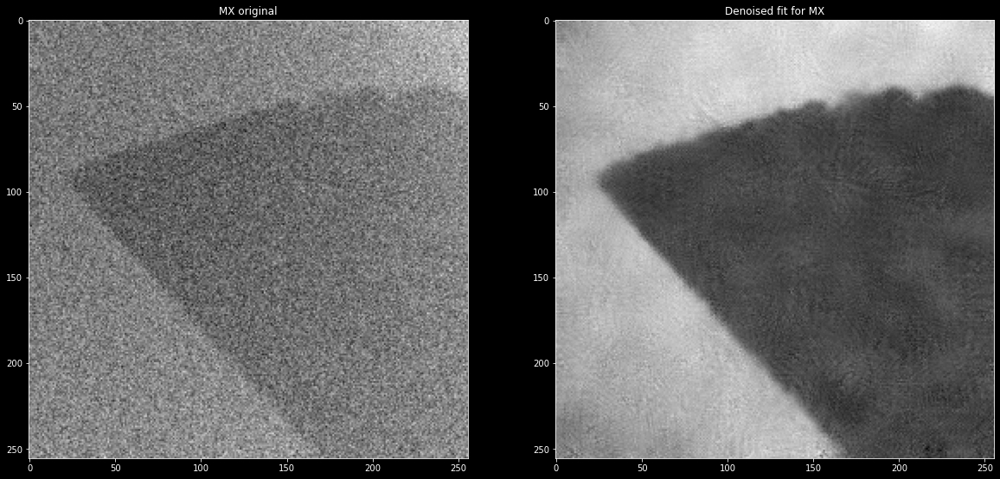

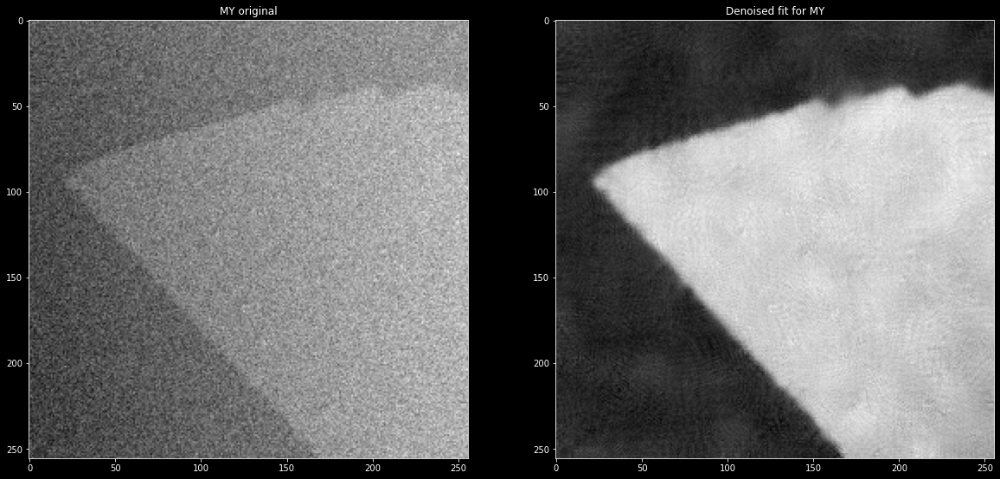

In [14]:
plt.figure(figsize=(20, 10));

plt.subplot(1, 2, 1);
plt.imshow(m_1, cmap='gray');
plt.title('M{} original'.format(axis_1));
plt.subplot(1, 2, 2);
plt.imshow(m_1_fitted_denoised, cmap='gray');
plt.title('Denoised fit for M{}'.format(axis_1));

plt.figure(figsize=(20, 10));

plt.subplot(1, 2, 1);
plt.imshow(m_2, cmap='gray');
plt.title('M{} original'.format(axis_2));
plt.subplot(1, 2, 2);
plt.imshow(m_2_fitted_denoised, cmap='gray');
plt.title('Denoised fit for M{}'.format(axis_2));

# Find offsets

The imaging components do not use the same zero point. Since the magnetization vector should have the same magnitude over the entire sample, minimize the min to max spread across the combined images.

In [15]:
# Minimize the min to max spread on the magnitudes of the combines images. Use CoM for a starting point.

offsets, status, message = find_offsets(m_1_fitted_denoised, m_2_fitted_denoised)
m_1_offset, m_2_offset = offsets

print('Found offsets: {}'.format(offsets))
print('Status code {}: {}'.format(status, message))
print("Raw files' ptp: {:.5f}".format(np.ptp(get_magnitudes(m_1, m_2))))
print("Offset files' ptp: {:.5f}".format(np.ptp(get_magnitudes(m_1_fitted_denoised - offsets[0], m_2_fitted_denoised - offsets[1]))))

Found offsets: [ 1.15312189 -0.0505653 ]
Status code 3: `xtol` termination condition is satisfied.
Raw files' ptp: 1.00846
Offset files' ptp: 0.71698


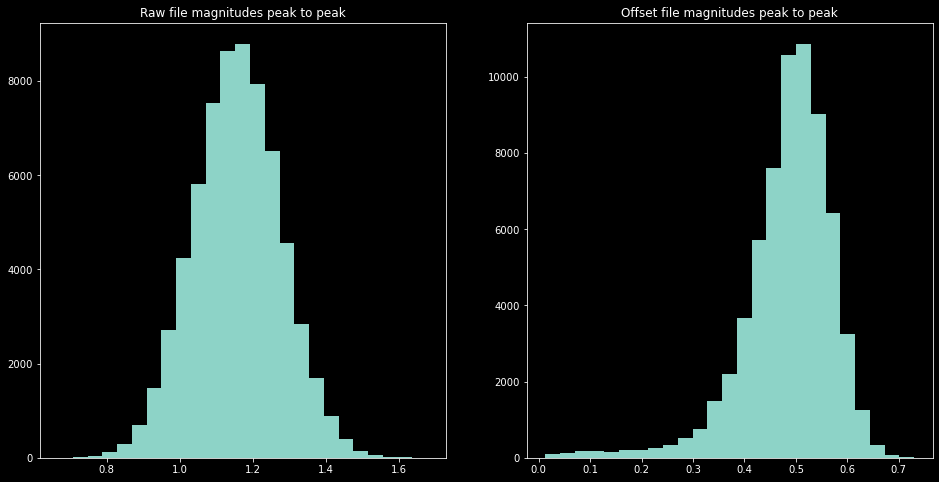

In [16]:
plt.figure(figsize=(16, 8));
plt.subplot(1, 2, 1);
plt.hist(get_magnitudes(m_1, m_2).ravel(), bins=25);
plt.title('Raw file magnitudes peak to peak');
plt.subplot(1, 2, 2);
plt.hist(get_magnitudes(m_1_fitted_denoised - m_1_offset, m_2_fitted_denoised - m_2_offset).ravel(), bins=25);
plt.title('Offset file magnitudes peak to peak');

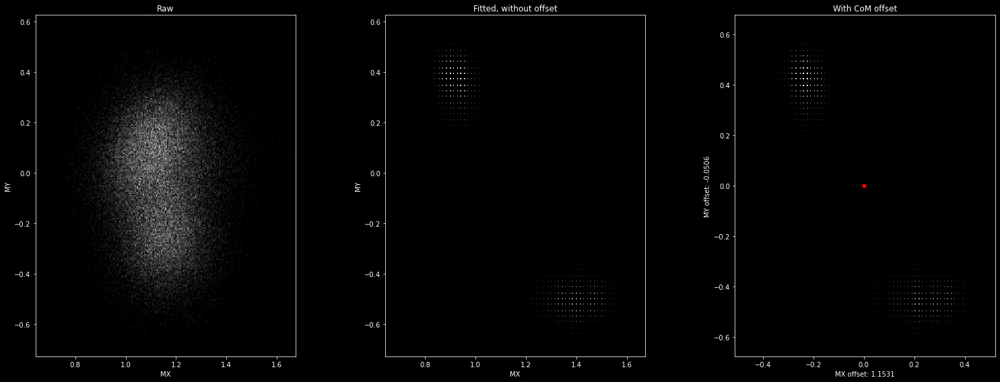

In [17]:
fig = plt.figure(figsize=(22, 8));
ax1 = fig.add_subplot(1, 3, 1);
ax2 = fig.add_subplot(1, 3, 2);
ax3 = fig.add_subplot(1, 3, 3);

ax1.hist2d(m_1.ravel(), m_2.ravel(), bins=256, cmap='gray');
ax1.set_xlabel('M{}'.format(axis_1));
ax1.set_ylabel('M{}'.format(axis_2));
ax1.set_title('Raw');
ax1.set_aspect('equal');

ax2.hist2d(m_1_fitted_denoised.ravel(), m_2_fitted_denoised.ravel(), bins=256, cmap='gray');
ax2.set_xlabel('M{}'.format(axis_1));
ax2.set_ylabel('M{}'.format(axis_2));
ax2.set_title('Fitted, without offset');
ax2.set_aspect('equal');

ax3.hist2d(m_1_fitted_denoised.ravel() - m_1_offset, m_2_fitted_denoised.ravel() - m_2_offset, bins=256, cmap='gray');
ax3.plot(0, 0, 'r.', ms=10);
ax3.set_xlabel('M{} offset: {:.4f}'.format(axis_1, m_1_offset));
ax3.set_ylabel('M{} offset: {:.4f}'.format(axis_2, m_2_offset));
ax3.set_title('With CoM offset');
ax3.set_aspect('equal');

plt.tight_layout();

# Apply offsets

In [18]:
# Apply offsets

m_1_denoised, m_2_denoised = m_1_fitted_denoised - m_1_offset, m_2_fitted_denoised - m_2_offset

print('M{} denoised - min: {:.2f}, max: {:.2f}, average: {:.2f}, PtP: {:.2f}'.format(
    axis_1, m_1_denoised.min(), m_1_denoised.max(), np.average(m_1_denoised), np.ptp(m_1_denoised)))
print('M{} denoised - min: {:.2f}, max: {:.2f}, average: {:.2f}, PtP: {:.2f}'.format(
    axis_2, m_2_denoised.min(), m_2_denoised.max(), np.average(m_2_denoised), np.ptp(m_2_denoised)))

MX denoised - min: -0.51, max: 0.52, average: -0.01, PtP: 1.03
MY denoised - min: -0.68, max: 0.68, average: 0.01, PtP: 1.35


In [19]:
# Extract phase and magnitude information

phases = get_phases(m_1_denoised, m_2_denoised)
magnitudes = get_magnitudes(m_1_denoised, m_2_denoised)

# Display results

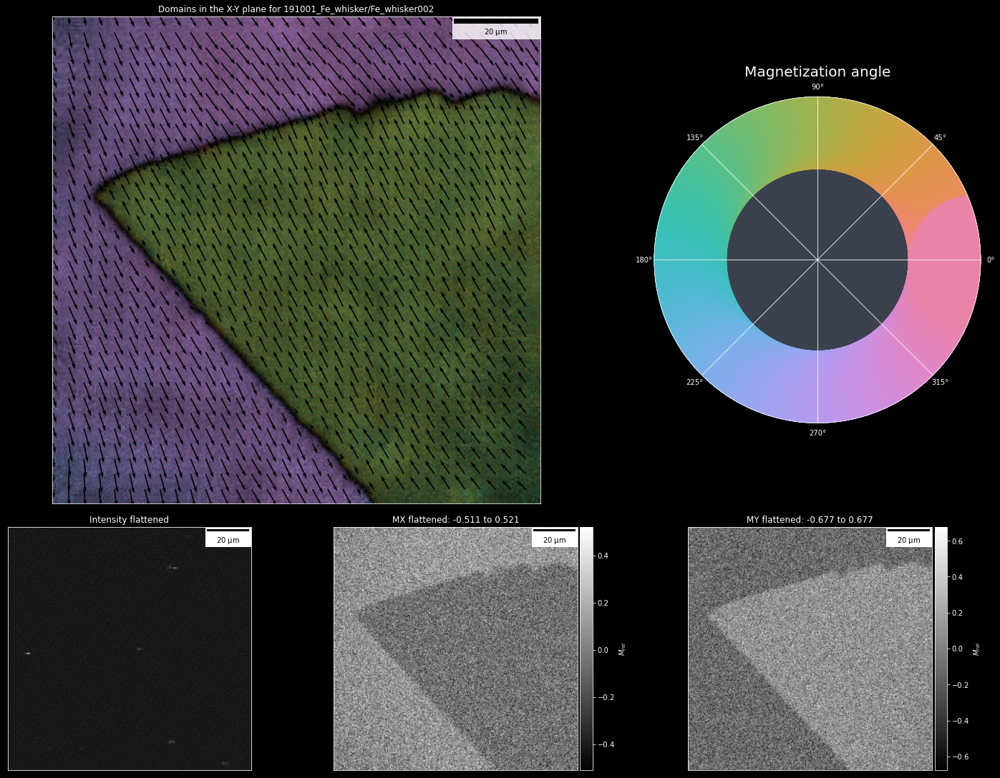

In [20]:
# Show a colorized version of the domains

img = render_phases_and_magnitudes(magnitudes, phases)

display_results(img, m_1_denoised, m_1_light_fitted - m_1_offset, m_2_denoised, m_2_light_fitted - m_2_offset, intensity_flat, scale, full_name, arrow_scale=4, axis_1=axis_1, axis_2=axis_2)

In [21]:
save_file(file, img, axis_1, axis_2, scale)